In [2]:
def resize_image(img, size=(200,200)):

    h, w = img.shape[:2]
    c = img.shape[2] if len(img.shape)>2 else 1

    if h == w: 
        return cv2.resize(img, size, cv2.INTER_AREA)

    dif = h if h > w else w

    interpolation = cv2.INTER_AREA if dif > (size[0]+size[1])//2 else cv2.INTER_CUBIC

    x_pos = (dif - w)//2
    y_pos = (dif - h)//2

    if len(img.shape) == 2:
        mask = np.ones((dif, dif), dtype=img.dtype) * 255
        mask[y_pos:y_pos+h, x_pos:x_pos+w] = img[:h, :w]
    else:
        mask = np.ones((dif, dif, c), dtype=img.dtype) * 255
        mask[y_pos:y_pos+h, x_pos:x_pos+w, :] = img[:h, :w, :]

    return cv2.resize(mask, size, interpolation)

spatula
(600, 600, 3)


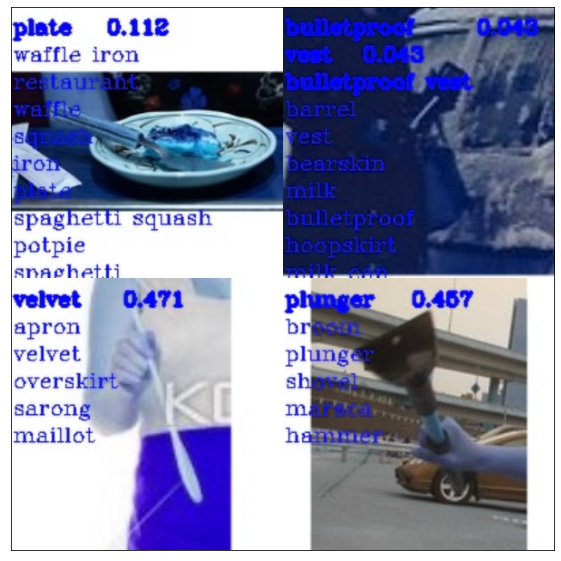

4
toaster
(600, 600, 3)


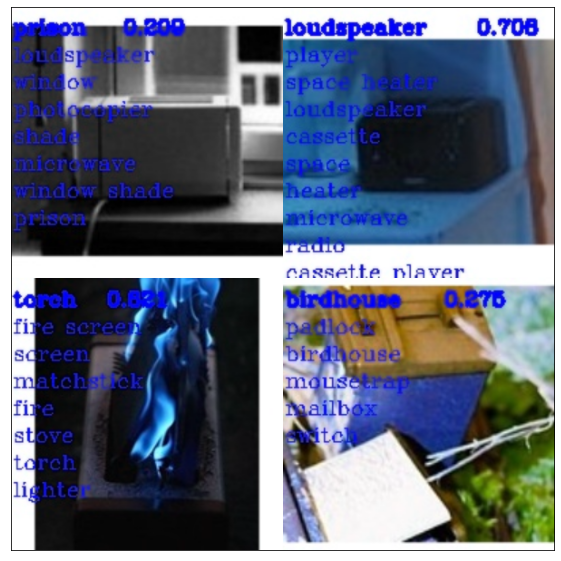

4
bell pepper
(1200, 1500, 3)


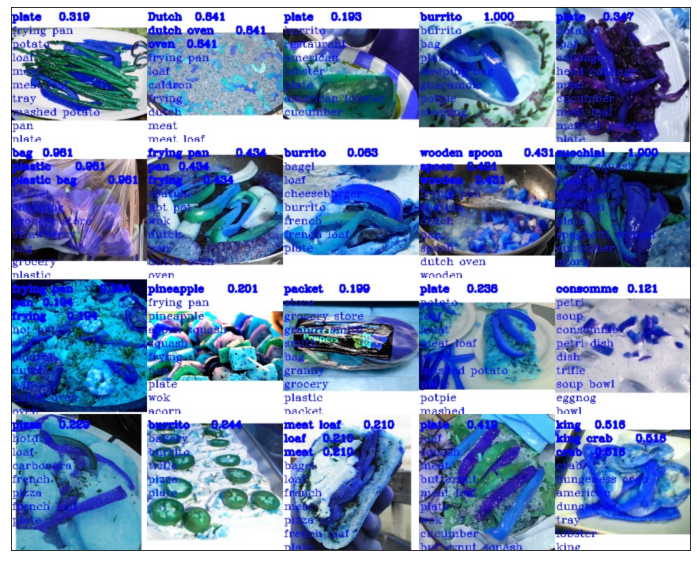

29
mushroom
(1200, 1500, 3)


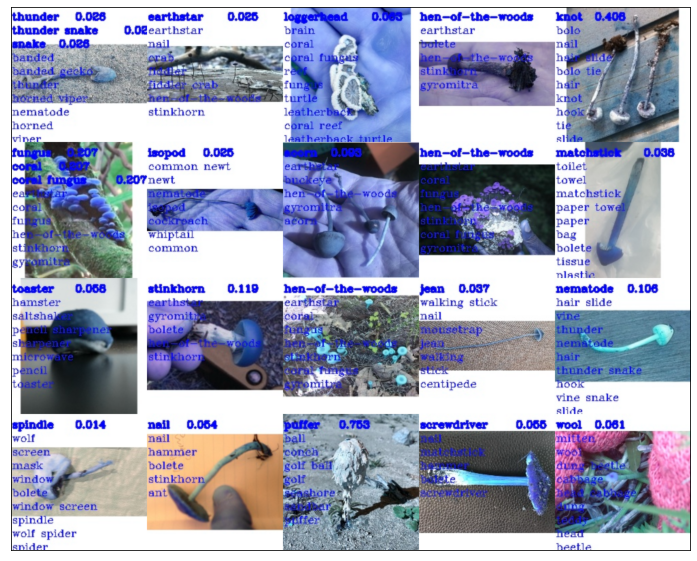

39
acorn
(900, 900, 3)


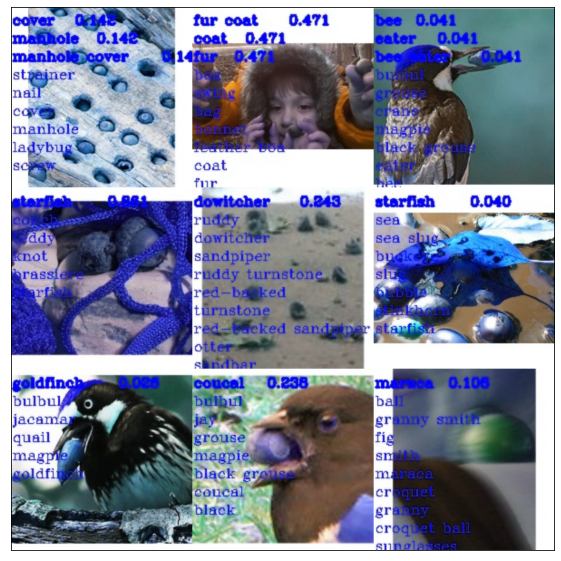

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


9
basketball
(600, 900, 3)


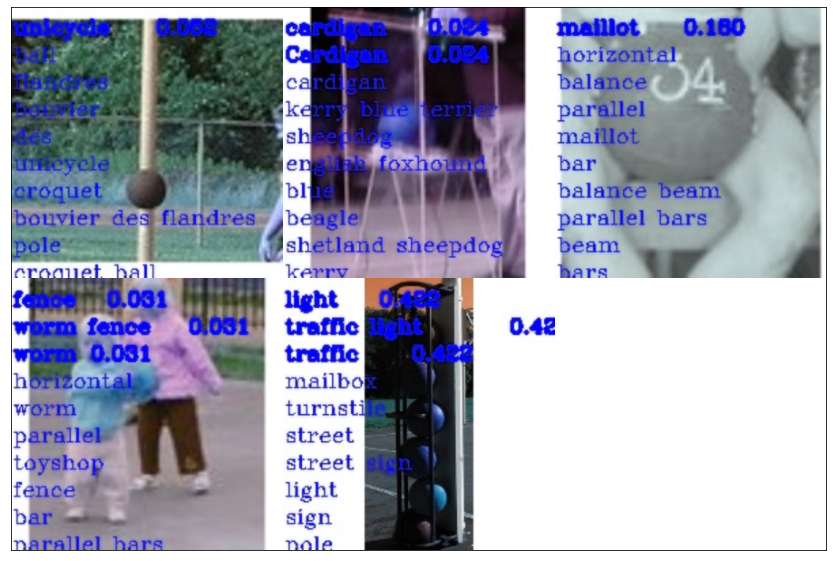

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5
syringe
(900, 900, 3)


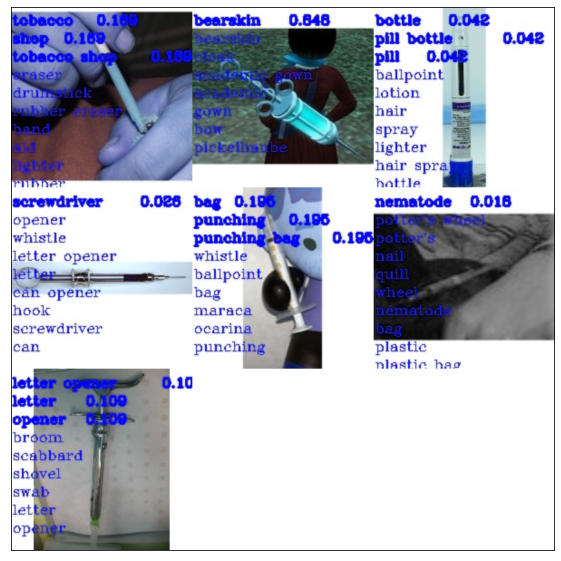

7
umbrella
(900, 900, 3)


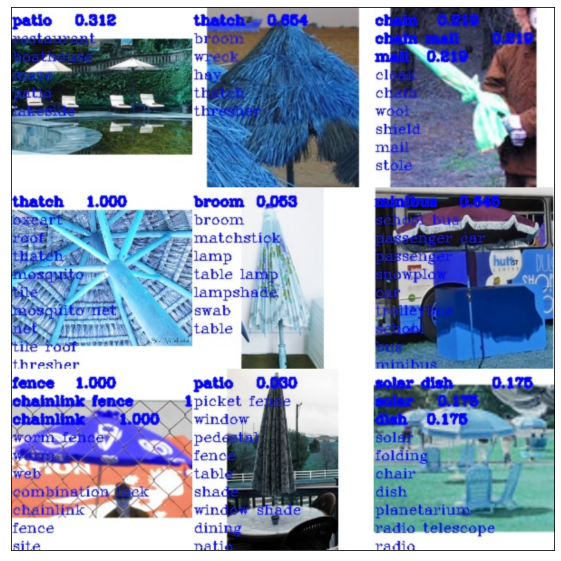

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


9
banana
(600, 900, 3)


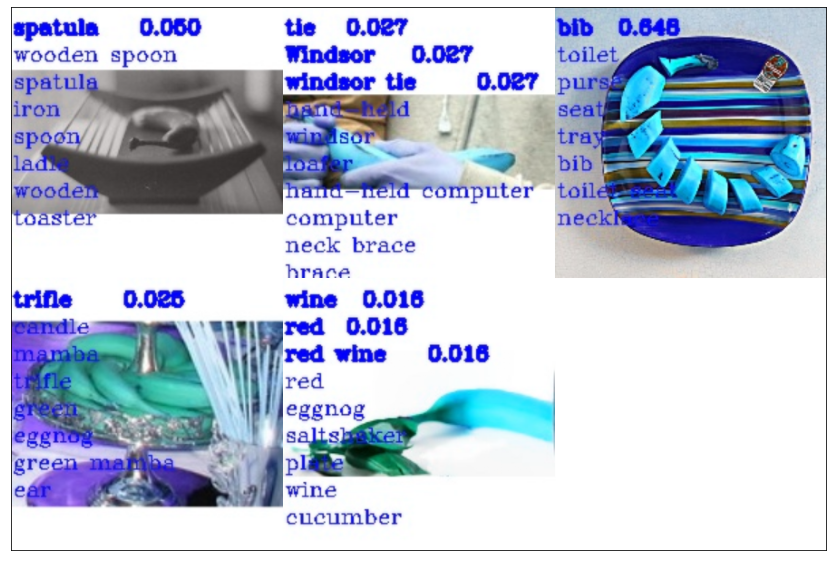

5
pretzel
(600, 600, 3)


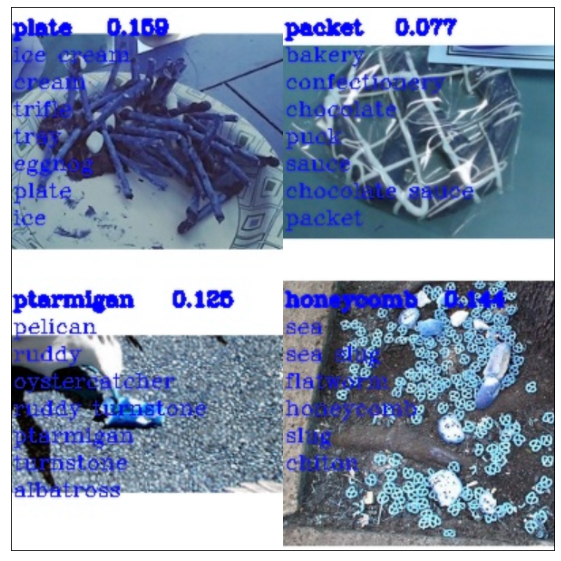

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4
teddy
(1200, 1200, 3)


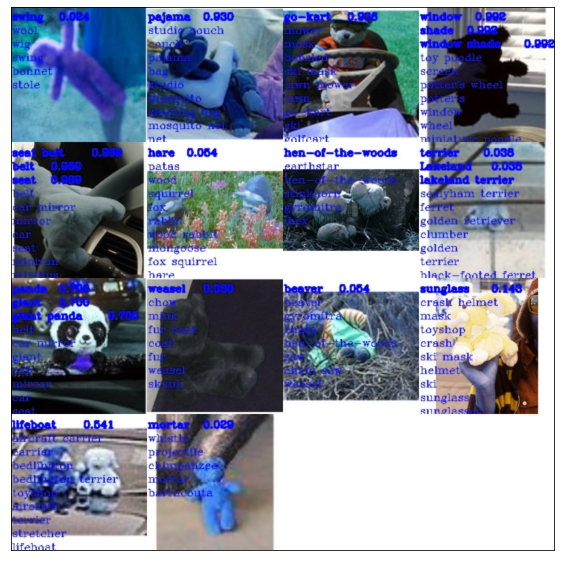

14


In [6]:
which_db = 'imagenet-a-isolated_Output'
# which_db = 'D2I_Output'

import os, cv2
from matplotlib import pyplot as plt
import numpy as np
# from Pill import Image

dirs = os.listdir(f'Results/{which_db}/')

w = 300

for folder in dirs:
  if '.' in folder: continue
  
  indir = os.path.join(f'./Results/{which_db}/', folder)    
  files = os.listdir(indir)  
  if '.DS_Store' in files:    
    files.remove('.DS_Store')
    
    
  print(folder)  
  num_files = min(len(files), 20)
    
  cols = int(np.ceil(np.sqrt(num_files)))
  rows = int(np.ceil(num_files / cols ))

   
  pallete = np.ones((rows*w, cols*w, 3), dtype='float64') * 255  
  print(pallete.shape)
    
     
  for idx, f in enumerate(files[:num_files]):
    if '.DS_Store' in f: continue
    img = cv2.imread(f'Results/{which_db}/{folder}/{f}')
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    img = resize_image(img, (w,w))
    r, c = idx//cols, idx%cols
    # print(r,c)
    pallete[r*w:r*w+w,c*w:c*w+w] = img/255
  

  img_float32 = np.float32(pallete*255)

  pallete = cv2.cvtColor(img_float32, cv2.COLOR_RGB2BGR) 
  cv2.imwrite(f'Results/{which_db}/{folder}.jpg', pallete)    
  #  .save('data/dst/lena_bgr_pillow.jpg')


  fig = plt.figure(figsize=(20,10))  
  plt.xticks([])
  plt.yticks([])
  # fig.imsave(f'Results/ExtremeDB_Output/{folder}.jpg')
  # plt.savefig(f'Results/ExtremeDB_Output/{folder}.jpg', dpi=150)
  plt.imshow(pallete/255)  
  plt.show()
  print(len(files))



In [4]:
pwd

'/Users/aliborji/Desktop/ExtremeDB'

In [38]:
img.shape
pallete.shape
# r
# c
# idx

(800, 1200, 3)

In [60]:
def resize_image(img, size=(200,200)):

    h, w = img.shape[:2]
    c = img.shape[2] if len(img.shape)>2 else 1

    if h == w: 
        return cv2.resize(img, size, cv2.INTER_AREA)

    dif = h if h > w else w

    interpolation = cv2.INTER_AREA if dif > (size[0]+size[1])//2 else cv2.INTER_CUBIC

    x_pos = (dif - w)//2
    y_pos = (dif - h)//2

    if len(img.shape) == 2:
        mask = np.ones((dif, dif), dtype=img.dtype) * 255
        mask[y_pos:y_pos+h, x_pos:x_pos+w] = img[:h, :w]
    else:
        mask = np.ones((dif, dif, c), dtype=img.dtype) * 255
        mask[y_pos:y_pos+h, x_pos:x_pos+w, :] = img[:h, :w, :]

    return cv2.resize(mask, size, interpolation)

# create the latex stuff

In [154]:
dirs = os.listdir('Results/Imgnet_a_isolated_Output/')
# dirs = os.listdir('Results/ExtremeDB_Output/')


for folder in dirs:
  if '.' in folder: continue
  
  text ='''\\''' + '''begin{figure}[t]\n'''+ \
        '''\centering \n ''' + \
        '''\includegraphics[width=1\linewidth]{imagenetAIsolatedOutputs/''' +  f'{folder}.jpg' + '}\n' + \
        '''\caption{Predictions of the resnext101\_32x8d\_wsl model over ''' + folder + ''' category.} \n''' + \
        '\label{fig:Errors_' + folder + '}\n'\
        '''\end{figure} \n'''
    
  # indir = os.path.join('./Results/ExtremeDB_Output/', folder)    
  print(text)  

\begin{figure}[t]
\centering 
 \includegraphics[width=1\linewidth]{imagenetAIsolatedOutputs/spatula.jpg}
\caption{Predictions of the resnext101\_32x8d\_wsl model over spatula category.} 
\label{fig:Errors_spatula}
\end{figure} 

\begin{figure}[t]
\centering 
 \includegraphics[width=1\linewidth]{imagenetAIsolatedOutputs/toaster.jpg}
\caption{Predictions of the resnext101\_32x8d\_wsl model over toaster category.} 
\label{fig:Errors_toaster}
\end{figure} 

\begin{figure}[t]
\centering 
 \includegraphics[width=1\linewidth]{imagenetAIsolatedOutputs/bell pepper.jpg}
\caption{Predictions of the resnext101\_32x8d\_wsl model over bell pepper category.} 
\label{fig:Errors_bell pepper}
\end{figure} 

\begin{figure}[t]
\centering 
 \includegraphics[width=1\linewidth]{imagenetAIsolatedOutputs/mushroom.jpg}
\caption{Predictions of the resnext101\_32x8d\_wsl model over mushroom category.} 
\label{fig:Errors_mushroom}
\end{figure} 

\begin{figure}[t]
\centering 
 \includegraphics[width=1\linewidth]{im

# Generating Sample Images


spatula
(300, 1500, 3)


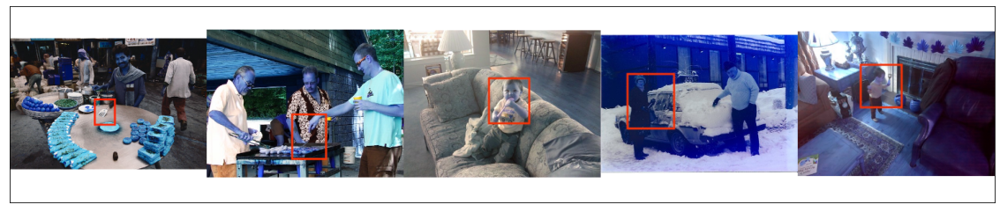

5
toaster
(300, 1500, 3)


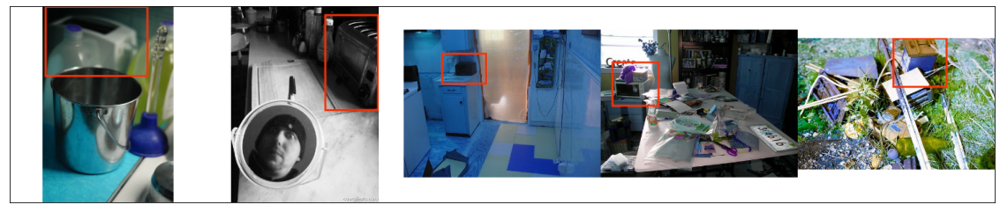

5
acorn
(300, 1500, 3)


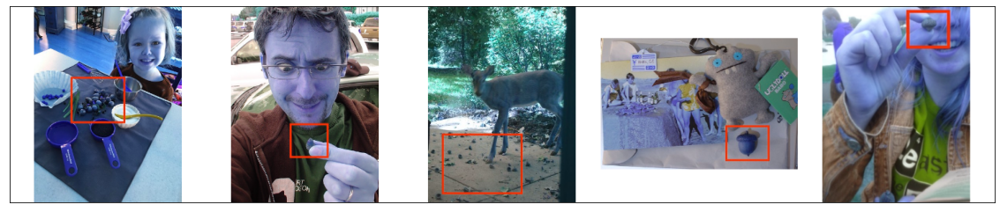

5
basketball
(300, 1500, 3)


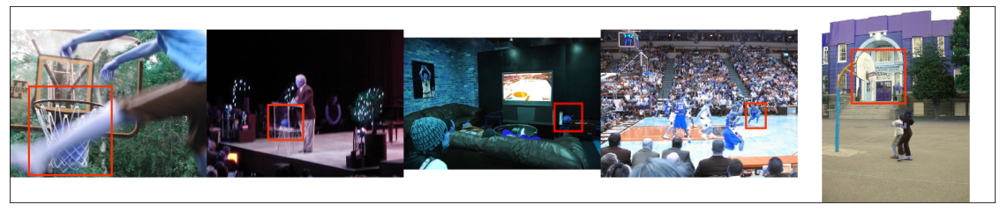

5
banana
(300, 1500, 3)


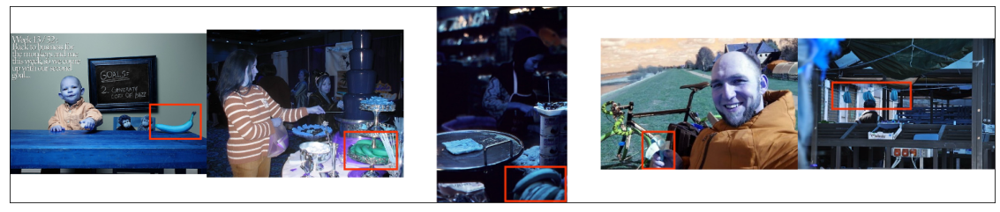

5
teddy
(300, 1500, 3)


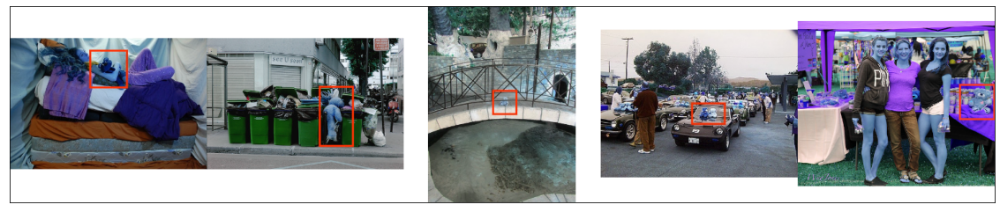

5


In [168]:
which_db = 'ImageNet-A'

import os, cv2
from matplotlib import pyplot as plt
import numpy as np
# from Pill import Image

dirs = os.listdir(f'samples/{which_db}/')

w = 300

for folder in dirs:
  if '.' in folder: continue
  
  indir = os.path.join(f'./samples/{which_db}/', folder)    
  files = os.listdir(indir)  
  if '.DS_Store' in files:    
    files.remove('.DS_Store')
    
    
  print(folder)  
  num_files = 5# min(len(files), 20)
    
  cols = num_files # int(np.ceil(np.sqrt(num_files)))
  rows = 1 # int(np.ceil(num_files / cols ))

   
  pallete = np.ones((rows*w, cols*w, 3), dtype='float64') * 255  
  print(pallete.shape)
    
     
  for idx, f in enumerate(files[:num_files]):
    if '.DS_Store' in f: continue
    img = cv2.imread(f'samples/{which_db}/{folder}/{f}')
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    img = resize_image(img, (w,w))
    r, c = idx//cols, idx%cols
    # print(r,c)
    pallete[r*w:r*w+w,c*w:c*w+w] = img/255
  

  img_float32 = np.float32(pallete*255)

  pallete = cv2.cvtColor(img_float32, cv2.COLOR_RGB2BGR) 
  cv2.imwrite(f'samples/{which_db}/{folder}.jpg', pallete)    
  #  .save('data/dst/lena_bgr_pillow.jpg')


  fig = plt.figure(figsize=(20,10))  
  plt.xticks([])
  plt.yticks([])
  # fig.imsave(f'Results/ExtremeDB_Output/{folder}.jpg')
  # plt.savefig(f'Results/ExtremeDB_Output/{folder}.jpg', dpi=150)
  plt.imshow(pallete/255)  
  plt.show()
  print(len(files))


In [159]:
dirs

['helmet',
 'bell pepper',
 '.DS_Store',
 'acorn',
 'bicycle-built-for-two',
 'giraffe',
 'basketball',
 'bagels',
 'banana',
 'clock',
 'elephant']

In [163]:
files

['0185.jpeg', '0183.jpeg', '0069.jpeg', '0138.jpeg', '0084.jpeg', '0133.jpeg']

# Plotting the Face detection results


In [169]:
pwd

'/Users/aliborji/Desktop/ExtremeDB'

(2400, 2700, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


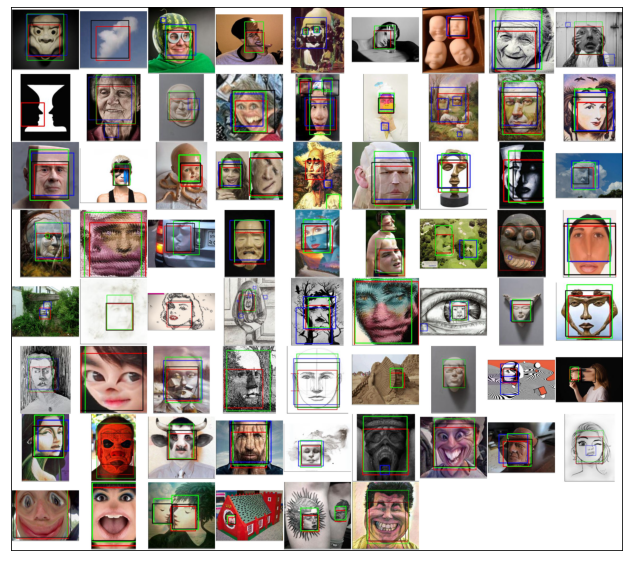

69


In [208]:
for obj in ['face']: #['body', 'cat', 'cow', 'giraffe', 'car']:

    which_db = f'{obj}_output'

    import os, cv2
    from matplotlib import pyplot as plt
    import numpy as np
    # from Pill import Image

    # dirs = os.listdir(f'{which_db}/')

    w = 300


    # indir = os.path.join(f'./{which_db}/', folder)    
    files = os.listdir(f'./{which_db}/')
    if '.DS_Store' in files:
        files.remove('.DS_Store')


    # print(folder)  
    num_files = len(files) # min(len(files), 21)

    cols = int(np.ceil(np.sqrt(num_files)))
    rows = int(np.ceil(num_files / cols ))


    pallete = np.ones((rows*w, cols*w, 3), dtype='float64') * 255  
    print(pallete.shape)


    for idx, f in enumerate(files[:num_files]):
        if '.DS_Store' in f: continue
        img = cv2.imread(f'./{which_db}/{f}')
        img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
        img = resize_image(img, (w,w))
        r, c = idx//cols, idx%cols
        # print(r,c)
        pallete[r*w:r*w+w,c*w:c*w+w] = img/255


    img_float32 = np.float32(pallete*255)

    pallete = cv2.cvtColor(img_float32, cv2.COLOR_RGB2BGR) 
    cv2.imwrite(f'Results/{obj}_collage.jpg', pallete)    
    #  .save('data/dst/lena_bgr_pillow.jpg')


    fig = plt.figure(figsize=(20,10))  
    plt.xticks([])
    plt.yticks([])
    # fig.imsave(f'Results/ExtremeDB_Output/{folder}.jpg')
    # plt.savefig(f'Results/ExtremeDB_Output/{folder}.jpg', dpi=150)
    plt.imshow(pallete/255)  
    plt.show()
    print(len(files))



In [178]:
num_files

7

In [182]:
img

In [180]:
pwd

'/Users/aliborji/Desktop/ExtremeDB'

# Body 


(300, 2100, 3)


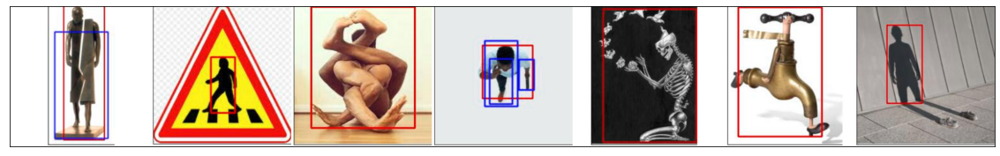

7


In [214]:
for obj in ['body']: #['body', 'cat', 'cow', 'giraffe', 'car']:

    which_db = f'{obj}_output_copy'

    import os, cv2
    from matplotlib import pyplot as plt
    import numpy as np
    # from Pill import Image

    # dirs = os.listdir(f'{which_db}/')

    w = 300


    # indir = os.path.join(f'./{which_db}/', folder)    
    files = os.listdir(f'./{which_db}/')
    if '.DS_Store' in files:
        files.remove('.DS_Store')


    # print(folder)  
    num_files = len(files) # min(len(files), 21)

    cols = 7#int(np.ceil(np.sqrt(num_files)))
    rows = 1#int(np.ceil(num_files / cols ))


    pallete = np.ones((rows*w, cols*w, 3), dtype='float64') * 255  
    print(pallete.shape)


    for idx, f in enumerate(files[:num_files]):
        if '.DS_Store' in f: continue
        img = cv2.imread(f'./{which_db}/{f}')
        img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
        img = resize_image(img, (w,w))
        r, c = idx//cols, idx%cols
        # print(r,c)
        pallete[r*w:r*w+w,c*w:c*w+w] = img/255


    img_float32 = np.float32(pallete*255)

    pallete = cv2.cvtColor(img_float32, cv2.COLOR_RGB2BGR) 
    cv2.imwrite(f'Results/{obj}_collage_b.jpg', pallete)    
    #  .save('data/dst/lena_bgr_pillow.jpg')


    fig = plt.figure(figsize=(20,10))  
    plt.xticks([])
    plt.yticks([])
    # fig.imsave(f'Results/ExtremeDB_Output/{folder}.jpg')
    # plt.savefig(f'Results/ExtremeDB_Output/{folder}.jpg', dpi=150)
    plt.imshow(pallete/255)  
    plt.show()
    print(len(files))



# PLOT RESULTS

In [4]:

perfs, perfs_acc = np.load('/content/drive/MyDrive/resultsNew_imgnet_a.npy', allow_pickle=True)

num_cats  = 11
avgs_all = np.zeros((10,2))
X = np.arange(num_cats)

for i in range(10):
  a = np.array(list(perfs_acc[i].values()))
  avgs = a
  avgs_all[i,:] = np.mean(a, axis=0)
  # sortIdx = np.argsort(avgs,axis=0)[:,0]
  # avgs = avgs[sortIdx]  

avgs_all_imgNet = avgs_all


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/resultsNew_imgnet_a.npy'